30 <><><><><<><><><><><><><><<><><><><><><><><><><>
________________________________________________________
>>>>>>>>>> EXPERIMENT efficientnet_b0_aucbased_10min_adam
fold 0 -----------------------------------
best_epoch 42
fold 1 -----------------------------------
best_epoch 12
fold 2 -----------------------------------
best_epoch 36
fold 3 -----------------------------------
best_epoch 218
fold 4 -----------------------------------
best_epoch 68
fold 5 -----------------------------------
best_epoch 497
fold 6 -----------------------------------
best_epoch 92
fold 7 -----------------------------------
best_epoch 346
fold 8 -----------------------------------
best_epoch 22
fold 9 -----------------------------------
best_epoch 143


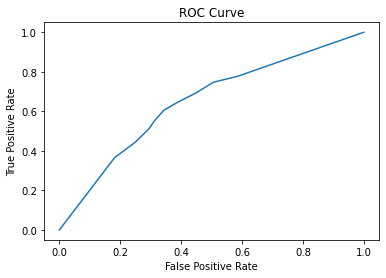

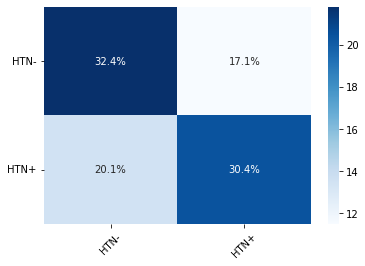

average accuracy : 0.628
average auc : 0.658
average sensitivity : 0.69
average specificity : 0.637
------------------------------
THE BEST IN ENTIRE FOLDS: 


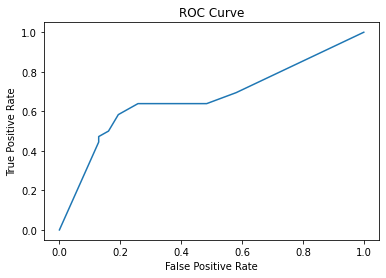

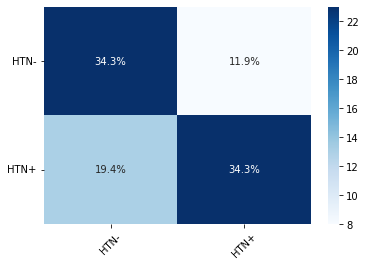

The best Acc 0.6866, The best AUC 0.6774, The best sensitivity 0.6111, The best specificity 0.8065
SEED 30 best_accc 0.6866 best_aucc 0.6774
FOLD ended
Time for the determined epochs (min): 71.71964984734853
time passed 4303.178990840912


In [28]:
import os
import time
import copy
import argparse
import random
import statistics
import numpy as np
import pandas as pd
import scipy.signal
import scipy.interpolate
from sklearn.model_selection import KFold, train_test_split
from sklearn.metrics import confusion_matrix, roc_curve, auc, roc_auc_score, accuracy_score
from sklearn import preprocessing
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models
import torchvision.transforms as transforms
from torch.optim.lr_scheduler import MultiStepLR
from torchvision import datasets
from PIL import Image
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import product
import warnings


warnings.filterwarnings("ignore")

log = []
file_nn = np.load("file_nn.npy")
label_nn = np.load("label_nn.npy")
    

def transform_array_image(Images_, lbl):
    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize(mean=[0 ,0, 0], std=[1, 1, 1])])
    Images__ = []
    lbls = []
    for idx, img in enumerate(Images_):
        img = (img * 1).astype(np.uint8)
        img = transforms.ToPILImage()(img)
        img = transform(img)
        Images__.append(img)
        lbls.append(lbl[idx])
        
    return Images__, lbls

def random_translate(img, translation_range, seed):
    random.seed(seed)
    max_translate_x, max_translate_y = translation_range
    translate_x = random.randint(-max_translate_x, max_translate_x)
    translate_y = random.randint(-max_translate_y, max_translate_y)
    img = img.transform(img.size, Image.AFFINE, (1, 0, translate_x, 0, 1, translate_y))
    return img

def add_small_noise(img, noise_level, seed):
    noisy_img = img  
    return noisy_img

def Confusion_pic(actual, y_pred_test, y_probs):
    cf1 = confusion_matrix(actual, y_pred_test)
    new_fpr, new_tpr, auc, best_threshold, sensitivity, specificity = Custom_ROC(y_probs, actual)
    return new_fpr, new_tpr, cf1, auc, best_threshold, sensitivity, specificity

def criterian_optimizer(lr, milestones, gamma, optimzer):
    criterion = nn.BCELoss()
    if optimzer == "adam":
        optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=0.0001)
    if optimzer == "adamW":
        optimizer = optim.AdamW(model.parameters(), lr=lr, weight_decay=0.0001)
    if optimzer == "sgd":
        optimizer = optim.SGD(model.parameters(), lr=lr, momentum=0.9, weight_decay=0.0001)
    scheduler = MultiStepLR(optimizer, milestones, gamma)
    return criterion, optimizer, scheduler


def model_load(train, model_name):
    if model_name == 'efficientnet_b0_aucbased':
        model = models.efficientnet_b0(pretrained=True)
        model.classifier[-1] = nn.Sequential(nn.Linear(1280, 1), nn.Sigmoid())
    elif model_name == 'resnet':
        model = models.resnet50(pretrained=True)
        num_features = model.fc.in_features
        model.fc = nn.Sequential(nn.Linear(num_features, 1), nn.Sigmoid())
    elif model_name == 'mobilenet':
        model = models.mobilenet_v2(pretrained=True)
        num_features = model.classifier[-1].in_features
        model.classifier[-1] = nn.Sequential(nn.Linear(num_features, 1), nn.Sigmoid())
    else:
        raise ValueError(f'Unsupported model name: {model_name}')

    # Set requires_grad attribute
    for param in model.parameters():
        param.requires_grad = False
    # Unfreeze last layers (specific numbers can be adjusted based on model architecture)
    for param in list(model.parameters())[-30:]:
        param.requires_grad = True

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    model.to(device)
    return model


def rocandconfusio_plot(fpr,tpr,cf, location):
    if cf == []:
        plt.plot(fpr,tpr)
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('ROC Curve')
        plt.savefig(location+"roc.png")
        plt.show()
        
    elif fpr == [] and tpr == []:
        total = sum(sum(row) for row in cf)
        percentages = [[f"{(val/total)*100:.1f}%" for val in row] for row in cf]
        sns.heatmap(cf, annot=percentages, fmt='', cmap='Blues')
        tick_labels = ['HTN-', 'HTN+']
        plt.gca().set_xticklabels(tick_labels)
        plt.gca().set_yticklabels(tick_labels)

        # Add '%' to the plot
        plt.gca().set_yticklabels(plt.gca().get_yticklabels(), rotation=0)
        plt.gca().set_xticklabels(plt.gca().get_xticklabels(), rotation=45)
        plt.gca().yaxis.tick_left()
        plt.gca().xaxis.tick_bottom()
        plt.savefig(location+"cf.png")
        plt.show()

    else:
        plt.plot(fpr,tpr)
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('ROC Curve')
        plt.savefig(location+"best_roc.png")
        plt.show()
        
        total = sum(sum(row) for row in cf)
        percentages = [[f"{(val/total)*100:.1f}%" for val in row] for row in cf]
        sns.heatmap(cf, annot=percentages, fmt='', cmap='Blues')
        
        tick_labels = ['HTN-', 'HTN+']
        plt.gca().set_xticklabels(tick_labels)
        plt.gca().set_yticklabels(tick_labels)

        # Add '%' to the plot
        plt.gca().set_yticklabels(plt.gca().get_yticklabels(), rotation=0)
        plt.gca().set_xticklabels(plt.gca().get_xticklabels(), rotation=45)
        plt.gca().yaxis.tick_left()
        plt.gca().xaxis.tick_bottom()
        plt.savefig(location+"best_cf.png")
        plt.show()
        
        
def Custom_ROC(y_prob, y_test):
    scores = y_prob
    step_size = .1
    new_thresholds = np.arange(0, 1 + step_size, step_size)
    new_fpr = []
    new_tpr = []
    Sensitivity = []
    Specificity  = []
   
    for threshold in new_thresholds:
        y_pred = (scores >= threshold).astype(int)
        tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
        new_fpr.append(fp / (fp + tn))
        new_tpr.append(tp / (tp + fn))
        Sensitivity.append(tp / (tp + fn))
        Specificity.append(tn / (tn + fp))

    auc = roc_auc_score(y_test, y_prob)
    best_threshold, sensitivity, specificity = find_best_threshold(y_prob, y_test)

    return new_fpr, new_tpr, auc, best_threshold, sensitivity, specificity
   
def find_best_threshold(y_prob, y_test):
    thresholds = np.arange(0, 1.01, 0.01)
    best_threshold = None
    best_sensitivity = 0
    best_specificity = 0
   
    for threshold in thresholds:
        sensitivity, specificity = calculate_sensitivity_specificity(y_prob, y_test, threshold)
       
        if sensitivity + specificity > best_sensitivity + best_specificity:
            best_sensitivity = sensitivity
            best_specificity = specificity
            best_threshold = threshold
   
    return best_threshold, best_sensitivity, best_specificity

def calculate_sensitivity_specificity(y_prob, y_test, threshold):
    y_pred = (y_prob >= threshold).astype(int)
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
    specificity = tn / (tn + fp)
    sensitivity = tp / (tp + fn)
    return sensitivity, specificity


def Considered_AHI_restriction_2(LOW_AHI, High_AHI):
    df = pd.read_csv('shhs1- 2.csv')
    AHI_base = LOW_AHI 
    filtered_df = df[((df["ahi_a0h3a"] < LOW_AHI) | (df["ahi_a0h3a"] > High_AHI)) & (df["htnderv_s1"] == 0) & (df["htnderv_s2"].notnull())]
    selected_basedonAHI = [str(x[0]) for x in filtered_df[["nsrrid"]].values]
    AHI_considered = []
    for patient in file_nn:
        if patient[6:-7] in selected_basedonAHI:
            AHI_considered.append(1)
        else:
            AHI_considered.append(0)

    AHI_considered = np.array(AHI_considered)
    Consider = [np.array(AHI_considered)==1][0]

    return(Consider)


def ress_averaging(ress, location):
    names = ["new_fpr", "new_tpr", "cf1", "accuracy", "auc", "best_threshold", "sensitivity", "specificity"]
    dic_ress = {}
    dic_ress_final = {}
    for name in names:
        dic_ress[name] = [i[names.index(name)] for i in ress]
        if name in ["accuracy", "auc", "best_threshold", "sensitivity", "specificity"]:
            dic_ress_final[name] = np.mean(dic_ress[name])
            if name != "best_threshold":
                print("average", name, ":", round(dic_ress_final[name], 3))
        if name in ["new_fpr", "new_tpr"]:
            dic_ress_final[name] = [sum(items) / len(items) for items in zip(*dic_ress[name])]
            if 'new_fpr' in dic_ress_final and 'new_tpr' in dic_ress_final:
                rocandconfusio_plot(dic_ress_final["new_fpr"], dic_ress_final["new_tpr"], [], location)
        if name == "cf1":
            import seaborn as sns
            dic_ress_final[name] = [[sum(items) / len(items) for items in zip(*sublist)] for sublist in zip(*dic_ress[name])]
            rocandconfusio_plot([], [], dic_ress_final[name], location)

    print("------------------------------")
    print("THE BEST IN ENTIRE FOLDS: ")
    
    thebest_index = np.argmax(dic_ress["accuracy"])
    rocandconfusio_plot(dic_ress["new_fpr"][thebest_index], dic_ress["new_tpr"][thebest_index], dic_ress["cf1"][thebest_index], location)
    best_metrics = {metric: round(dic_ress[metric][thebest_index], 4) for metric in ["accuracy", "auc", "sensitivity", "specificity"]}
    print(f"The best Acc {best_metrics['accuracy']}, The best AUC {best_metrics['auc']}, The best sensitivity {best_metrics['sensitivity']}, The best specificity {best_metrics['specificity']}")
    
    return dic_ress_final, best_metrics['accuracy'], best_metrics['auc'], best_metrics['sensitivity'], best_metrics['specificity']



device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Define the number of folds and parameters
num_folds = 10
lrr = [.01]
milestones_list = [[70, 130, 160]]
gamma_list = [.3]
num_epochs = 500

train = 0

model_types = ['efficientnet_b0_aucbased']

t0 = time.time()
for dataset_type in ["10min"]:
    for optimzer in ["adam"]:
        for milestones, gamma, lr in product(milestones_list, gamma_list, lrr):
            t1 = time.time()
            for perc in [10]:
                for model_type in model_types:
                    if model_type == 'efficientnet_b0_aucbased':
                        SEED = 30
                    else:
                        SEED = 19
                    print(SEED, "<><><><><<><><><><><><><><<><><><><><><><><><><>")
                    ress = []
                    print("________________________________________________________")
                    print(">>>>>>>>>> EXPERIMENT", model_type + "_" + dataset_type + "_" + optimzer)
                    location = "Final_experiments_models_shhs/" + model_type + "_" + dataset_type + "_" + optimzer
                    torch.manual_seed(SEED)
                    np.random.seed(SEED)
                    random.seed(SEED)
                    
                    lbl = copy.deepcopy(np.array(label_nn))
                    if dataset_type == "10min":
                        Images_ = np.load("image maker-Image_only_resp_arousal_HRV_features_10min.npy")
                    if dataset_type == "60min":
                        Images_ = np.load("HRV_RESP_AROUSAL_ETC_60min.npy")

                    LOW_AHI, High_AHI = 6, 21
                    Consider = Considered_AHI_restriction_2(LOW_AHI, High_AHI)
                    lbl = lbl[Consider]
                    Images_ = Images_[Consider]

                    # Create the K_Fold object
                    kf = KFold(n_splits=num_folds, shuffle=True, random_state=SEED)

                    # Initialize lists to store the data
                    fold_images_train, fold_images_test, fold_labels_train, fold_labels_test = [], [], [], []
                    custom_images_train, custom_images_test, custom_labels_train, custom_labels_test = train_test_split(
                        Images_, lbl, test_size=perc/100, random_state=SEED)
                    fold_images_train.append(custom_images_train)
                    fold_images_test.append(custom_images_test)
                    fold_labels_train.append(custom_labels_train)
                    fold_labels_test.append(custom_labels_test)

                    # Split the remaining data into folds
                    for train_index, test_index in kf.split(Images_):
                        if len(fold_images_train) < num_folds:
                            images_train, images_test = Images_[train_index], Images_[test_index]
                            labels_train, labels_test = lbl[train_index], lbl[test_index]
                            fold_images_train.append(images_train)
                            fold_images_test.append(images_test)
                            fold_labels_train.append(labels_train)
                            fold_labels_test.append(labels_test)

                    # Initialize lists to store fold results
                    loss_list_train_folds, acc_list_train_folds, auc_list_train_folds = [], [], []
                    loss_list_test_folds, acc_list_test_folds, auc_list_test_folds = [], [], []

                    for fold in range(num_folds):
                        save_dir = "./saved_graphs/" + model_type + "/" + dataset_type + "/" + optimzer
                        os.makedirs(save_dir, exist_ok=True)

                        best_auc = -1
                        print("fold", fold, "-----------------------------------")
                        images_train = np.array(fold_images_train[fold])
                        images_test = np.array(fold_images_test[fold])
                        labels_train = np.array(fold_labels_train[fold])
                        labels_test = np.array(fold_labels_test[fold])

                        Image_train, label_train = transform_array_image(images_train, labels_train)
                        Image_test, label_test = transform_array_image(images_test, labels_test)

                        dataset_train = torch.utils.data.TensorDataset(torch.stack(Image_train), torch.LongTensor(label_train))
                        dataset_test = torch.utils.data.TensorDataset(torch.stack(Image_test), torch.LongTensor(label_test))
                        train_loader = torch.utils.data.DataLoader(dataset_train, batch_size=16, shuffle=True)
                        test_loader = torch.utils.data.DataLoader(dataset_test, batch_size=16, shuffle=False)
                        
                        model = model_load(train, model_type)
                        
                        criterion, optimizer, scheduler = criterian_optimizer(lr, milestones, gamma, optimzer)

                        loss_list_train, acc_list_train, auc_list_train = [], [], []
                        loss_list_test, acc_list_test, auc_list_test = [], [], []

                        # Training and Evaluation Loop
                        for epoch in range(num_epochs):
                            loss_epoch, y_probs_train, y_true_train, y_pred_train = 0, [], [], []
                            for images, labels in train_loader:
                                images = images.to(device)
                                labels = labels.float().to(device)
                                optimizer.zero_grad()
                                outputs = model(images)
                                loss = criterion(outputs.squeeze(-1), labels)
                                loss_epoch += loss.item()
                                loss.backward()
                                optimizer.step()

                                predicted = (outputs.data > .5).float()
                                y_probs_train.extend(outputs.data.cpu().numpy())
                                y_true_train.extend(labels.cpu().numpy())
                                y_pred_train.extend(predicted.cpu().numpy())

                            loss_epoch /= len(train_loader)
                            accuracy_train = accuracy_score(y_true_train, y_pred_train)
                            new_fpr, new_tpr, auc_train, best_threshold, sensitivity, specificity = Custom_ROC(y_probs_train, y_true_train)
                            loss_list_train.append(loss_epoch)
                            acc_list_train.append(accuracy_train)
                            auc_list_train.append(auc_train)
                            scheduler.step()

                            y_true, y_pred, y_probs, loss_epoch = [], [], [], 0
                            with torch.no_grad():
                                for images, labels in test_loader:
                                    images = images.to(device)
                                    labels = labels.float().to(device)
                                    outputs = model(images)
                                    
                                    
                                    loss = criterion(outputs.squeeze(-1), labels)
                                    loss_epoch += loss.item()
                                    predicted = (outputs.data > .5).float()
                                    y_probs.extend(outputs.data.cpu().numpy())
                                    y_true.extend(labels.cpu().numpy())
                                    y_pred.extend(predicted.cpu().numpy())

                            loss_epoch /= len(test_loader)
                            accuracy = accuracy_score(y_true, y_pred)
                            auc = roc_auc_score(y_true, y_probs)
                            new_fpr, new_tpr, auc_train, best_threshold, sensitivity, specificity = Custom_ROC(y_probs, y_true)
                            loss_list_test.append(loss_epoch)
                            acc_list_test.append(accuracy)
                            auc_list_test.append(auc_train)

                            if auc > best_auc:
                                best_epoch = epoch
                                y_true_best, y_pred_best, y_probs_best = y_true, y_pred, y_probs
                                best = accuracy
                                best_auc = auc
                                best_SEED = SEED
                                best_epoch = epoch
                                best_fold = fold

                        print("best_epoch", best_epoch)
                        new_fpr, new_tpr, cf1, auc, best_threshold, sensitivity, specificity = Confusion_pic(y_true_best, y_pred_best, y_probs_best)
                        ress.append([new_fpr, new_tpr, cf1, best, auc, best_threshold, sensitivity, specificity])

                        loss_list_train_folds.append(loss_list_train)
                        acc_list_train_folds.append(acc_list_train)
                        auc_list_train_folds.append(auc_list_train)
                        loss_list_test_folds.append(loss_list_test)
                        acc_list_test_folds.append(acc_list_test)
                        auc_list_test_folds.append(auc_list_test)

                  
                    np.save(os.path.join(save_dir, 'loss_list_train_folds.npy'), loss_list_train_folds)
                    np.save(os.path.join(save_dir, 'acc_list_train_folds.npy'), acc_list_train_folds)
                    np.save(os.path.join(save_dir, 'auc_list_train_folds.npy'), auc_list_train_folds)
                    np.save(os.path.join(save_dir, 'loss_list_test_folds.npy'), loss_list_test_folds)
                    np.save(os.path.join(save_dir, 'acc_list_test_folds.npy'), acc_list_test_folds)
                    np.save(os.path.join(save_dir, 'auc_list_test_folds.npy'), auc_list_test_folds)

                    average_dic, best_accc, best_aucc, best_sensivity, best_specifity = ress_averaging(ress, location)
                    print("SEED", SEED, "best_accc", best_accc, "best_aucc", best_aucc)
                    np.save(location + f"{SEED}", [average_dic, best_accc, best_aucc, best_sensivity, best_specifity])

                    print("FOLD ended")

            print("Time for the determined epochs (min):", (time.time() - t1) / 60)
            
            
print("time passed", time.time() - t0)

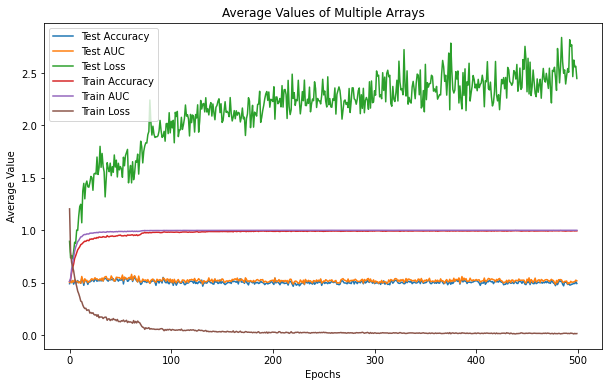

In [29]:
import numpy as np
import matplotlib.pyplot as plt

def plot_multiple_arrays(*file_paths, labels=None):
    plt.figure(figsize=(10, 6))

    for i, file_path in enumerate(file_paths):
        array = np.load(file_path, allow_pickle=True)
        average_array = np.mean(array, axis=0, keepdims=True)
        label = labels[i] if labels and i < len(labels) else f'Array {i + 1}'
        plt.plot(average_array[0], label=label)

    plt.xlabel('Epochs')
    plt.ylabel('Average Value')
    plt.title('Average Values of Multiple Arrays')
    plt.legend()
    plt.show()

file_paths = [
    './saved_graphs/efficientnet_b0_aucbased/10min/adam/acc_list_test_folds.npy',
    './saved_graphs/efficientnet_b0_aucbased/10min/adam/auc_list_test_folds.npy',
    './saved_graphs/efficientnet_b0_aucbased/10min/adam/loss_list_test_folds.npy',
    './saved_graphs/efficientnet_b0_aucbased/10min/adam/acc_list_train_folds.npy',
    './saved_graphs/efficientnet_b0_aucbased/10min/adam/auc_list_train_folds.npy',
    './saved_graphs/efficientnet_b0_aucbased/10min/adam/loss_list_train_folds.npy'
]

labels = ['Test Accuracy', 'Test AUC', 'Test Loss', 'Train Accuracy', 'Train AUC', 'Train Loss']

plot_multiple_arrays(*file_paths, labels=labels)


30 <><><><><<><><><><><><><><<><><><><><><><><><><>
________________________________________________________
>>>>>>>>>> EXPERIMENT efficientnet_b0_aucbased_10min_adamW
fold 3 -----------------------------------


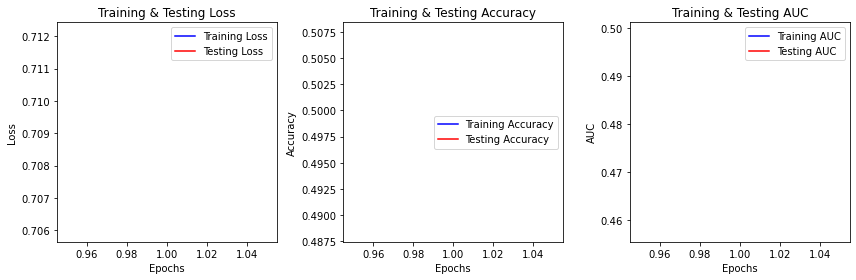

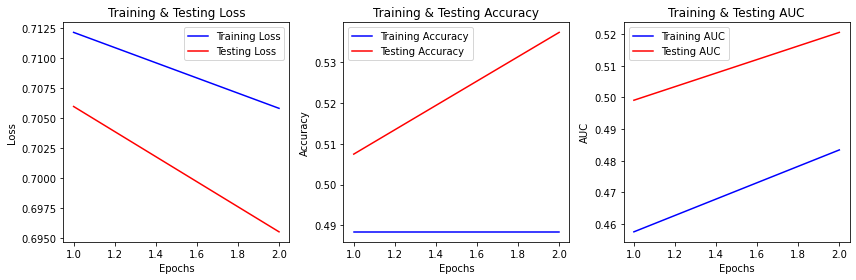

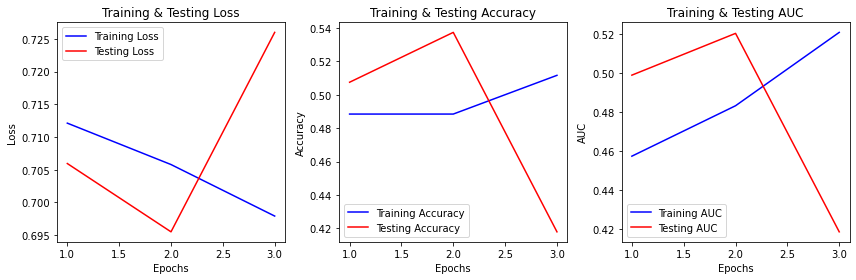

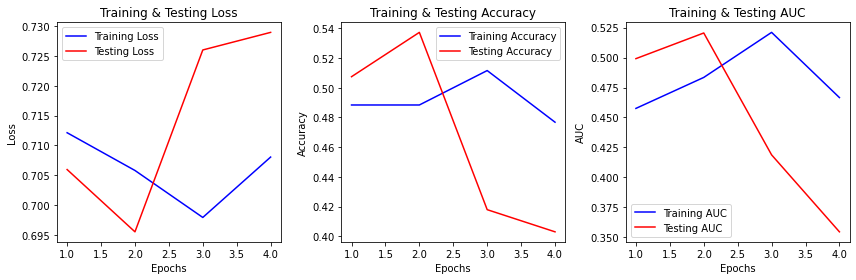

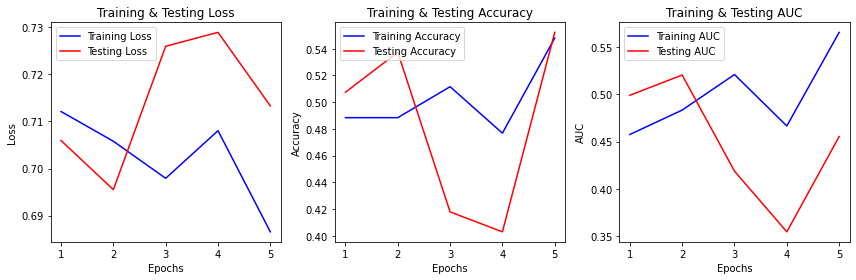

...

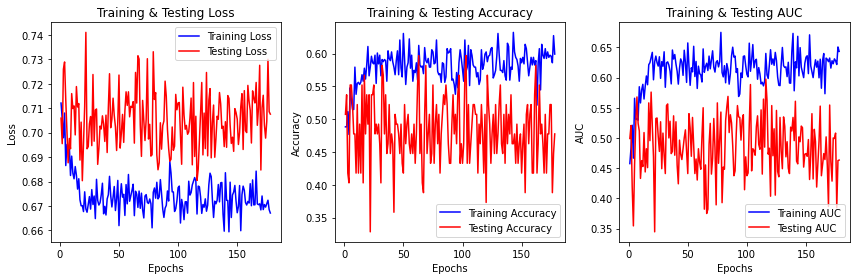

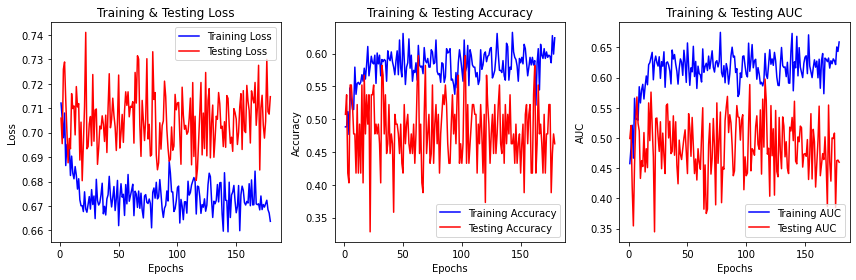

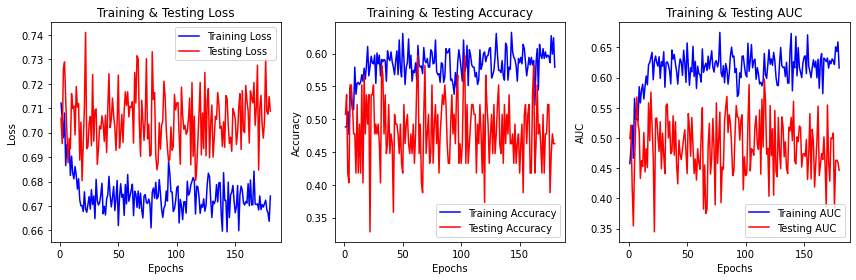

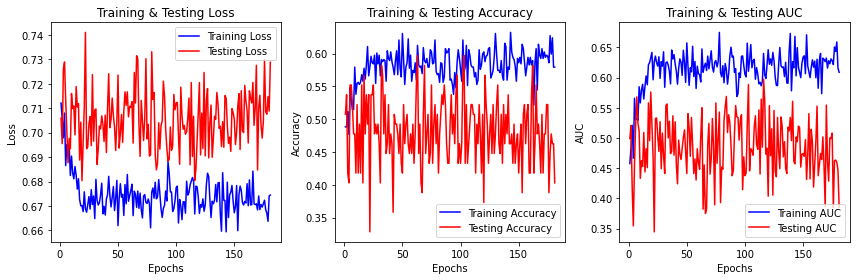

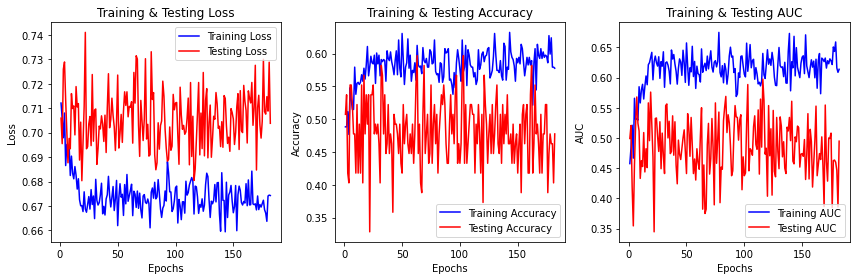


KeyboardInterrupt



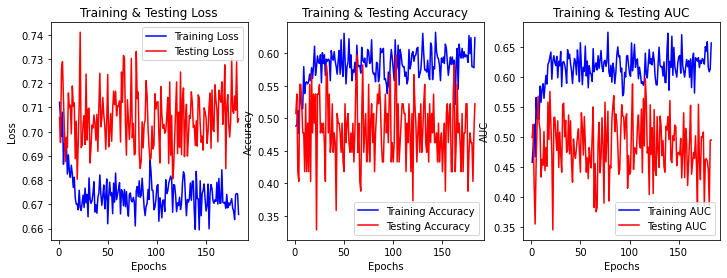

In [86]:
import os
import time
import copy
import argparse
import random
import statistics
import numpy as np
import pandas as pd
import scipy.signal
import scipy.interpolate
from sklearn.model_selection import KFold, train_test_split
from sklearn.metrics import confusion_matrix, roc_curve, auc, roc_auc_score, accuracy_score
from sklearn import preprocessing
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models
import torchvision.transforms as transforms
from torch.optim.lr_scheduler import MultiStepLR
from torchvision import datasets
from PIL import Image
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import product
import warnings


warnings.filterwarnings("ignore")

log = []
file_nn = np.load("file_nn.npy")
label_nn = np.load("label_nn.npy")
    

def transform_array_image(Images_, lbl):
    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize(mean=[0 ,0, 0], std=[1, 1, 1])])
    Images__ = []
    lbls = []
    for idx, img in enumerate(Images_):
        img = (img * 1).astype(np.uint8)
        img = transforms.ToPILImage()(img)
        img = transform(img)
        Images__.append(img)
        lbls.append(lbl[idx])
        
    return Images__, lbls

def random_translate(img, translation_range, seed):
    random.seed(seed)
    max_translate_x, max_translate_y = translation_range
    translate_x = random.randint(-max_translate_x, max_translate_x)
    translate_y = random.randint(-max_translate_y, max_translate_y)
    img = img.transform(img.size, Image.AFFINE, (1, 0, translate_x, 0, 1, translate_y))
    return img

def add_small_noise(img, noise_level, seed):
    noisy_img = img  
    return noisy_img

def Confusion_pic(actual, y_pred_test, y_probs):
    cf1 = confusion_matrix(actual, y_pred_test)
    new_fpr, new_tpr, auc, best_threshold, sensitivity, specificity = Custom_ROC(y_probs, actual)
    return new_fpr, new_tpr, cf1, auc, best_threshold, sensitivity, specificity

def criterian_optimizer(lr, milestones, gamma, optimzer):
    criterion = nn.BCELoss()
    if optimzer == "adam":
        optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=0.0001)
    if optimzer == "adamW":
        optimizer = optim.AdamW(model.parameters(), lr=lr, weight_decay=0.0001)
    if optimzer == "sgd":
        optimizer = optim.SGD(model.parameters(), lr=lr, momentum=0.9, weight_decay=0.0001)
    scheduler = MultiStepLR(optimizer, milestones, gamma)
    return criterion, optimizer, scheduler


def model_load(train, model_name):
    if model_name == 'efficientnet_b0_aucbased':
        model = models.efficientnet_b0(pretrained=True)
        model.classifier[-1] = nn.Sequential(nn.Linear(1280, 1), nn.Sigmoid())
    elif model_name == 'resnet':
        model = models.resnet50(pretrained=True)
        num_features = model.fc.in_features
        model.fc = nn.Sequential(nn.Linear(num_features, 1), nn.Sigmoid())
    elif model_name == 'mobilenet':
        model = models.mobilenet_v2(pretrained=True)
        num_features = model.classifier[-1].in_features
        model.classifier[-1] = nn.Sequential(nn.Linear(num_features, 1), nn.Sigmoid())
    else:
        raise ValueError(f'Unsupported model name: {model_name}')

    # Set requires_grad attribute
    for param in model.parameters():
        param.requires_grad = False
    # Unfreeze last layers (specific numbers can be adjusted based on model architecture)
    for param in list(model.parameters())[-30:]:
        param.requires_grad = True

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    model.to(device)
    return model


def rocandconfusio_plot(fpr,tpr,cf, location):
    if cf == []:
        plt.plot(fpr,tpr)
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('ROC Curve')
        plt.savefig(location+"roc.png")
        plt.show()
        
    elif fpr == [] and tpr == []:
        total = sum(sum(row) for row in cf)
        percentages = [[f"{(val/total)*100:.1f}%" for val in row] for row in cf]
        sns.heatmap(cf, annot=percentages, fmt='', cmap='Blues')
        tick_labels = ['HTN-', 'HTN+']
        plt.gca().set_xticklabels(tick_labels)
        plt.gca().set_yticklabels(tick_labels)

        # Add '%' to the plot
        plt.gca().set_yticklabels(plt.gca().get_yticklabels(), rotation=0)
        plt.gca().set_xticklabels(plt.gca().get_xticklabels(), rotation=45)
        plt.gca().yaxis.tick_left()
        plt.gca().xaxis.tick_bottom()
        plt.savefig(location+"cf.png")
        plt.show()

    else:
        plt.plot(fpr,tpr)
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('ROC Curve')
        plt.savefig(location+"best_roc.png")
        plt.show()
        
        total = sum(sum(row) for row in cf)
        percentages = [[f"{(val/total)*100:.1f}%" for val in row] for row in cf]
        sns.heatmap(cf, annot=percentages, fmt='', cmap='Blues')
        
        tick_labels = ['HTN-', 'HTN+']
        plt.gca().set_xticklabels(tick_labels)
        plt.gca().set_yticklabels(tick_labels)

        # Add '%' to the plot
        plt.gca().set_yticklabels(plt.gca().get_yticklabels(), rotation=0)
        plt.gca().set_xticklabels(plt.gca().get_xticklabels(), rotation=45)
        plt.gca().yaxis.tick_left()
        plt.gca().xaxis.tick_bottom()
        plt.savefig(location+"best_cf.png")
        plt.show()
        
        
def Custom_ROC(y_prob, y_test):
    scores = y_prob
    step_size = .1
    new_thresholds = np.arange(0, 1 + step_size, step_size)
    new_fpr = []
    new_tpr = []
    Sensitivity = []
    Specificity  = []
   
    for threshold in new_thresholds:
        y_pred = (scores >= threshold).astype(int)
        tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
        new_fpr.append(fp / (fp + tn))
        new_tpr.append(tp / (tp + fn))
        Sensitivity.append(tp / (tp + fn))
        Specificity.append(tn / (tn + fp))

    auc = roc_auc_score(y_test, y_prob)
    best_threshold, sensitivity, specificity = find_best_threshold(y_prob, y_test)

    return new_fpr, new_tpr, auc, best_threshold, sensitivity, specificity
   
def find_best_threshold(y_prob, y_test):
    thresholds = np.arange(0, 1.01, 0.01)
    best_threshold = None
    best_sensitivity = 0
    best_specificity = 0
   
    for threshold in thresholds:
        sensitivity, specificity = calculate_sensitivity_specificity(y_prob, y_test, threshold)
       
        if sensitivity + specificity > best_sensitivity + best_specificity:
            best_sensitivity = sensitivity
            best_specificity = specificity
            best_threshold = threshold
   
    return best_threshold, best_sensitivity, best_specificity

def calculate_sensitivity_specificity(y_prob, y_test, threshold):
    y_pred = (y_prob >= threshold).astype(int)
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
    specificity = tn / (tn + fp)
    sensitivity = tp / (tp + fn)
    return sensitivity, specificity


def Considered_AHI_restriction_2(LOW_AHI, High_AHI):
    df = pd.read_csv('shhs1- 2.csv')
    AHI_base = LOW_AHI 
    filtered_df = df[((df["ahi_a0h3a"] < LOW_AHI) | (df["ahi_a0h3a"] > High_AHI)) & (df["htnderv_s1"] == 0) & (df["htnderv_s2"].notnull())]
    selected_basedonAHI = [str(x[0]) for x in filtered_df[["nsrrid"]].values]
    AHI_considered = []
    for patient in file_nn:
        if patient[6:-7] in selected_basedonAHI:
            AHI_considered.append(1)
        else:
            AHI_considered.append(0)

    AHI_considered = np.array(AHI_considered)
    Consider = [np.array(AHI_considered)==1][0]

    return(Consider)


def ress_averaging(ress, location):
    names = ["new_fpr", "new_tpr", "cf1", "accuracy", "auc", "best_threshold", "sensitivity", "specificity"]
    dic_ress = {}
    dic_ress_final = {}
    for name in names:
        dic_ress[name] = [i[names.index(name)] for i in ress]
        if name in ["accuracy", "auc", "best_threshold", "sensitivity", "specificity"]:
            dic_ress_final[name] = np.mean(dic_ress[name])
            if name != "best_threshold":
                print("average", name, ":", round(dic_ress_final[name], 3))
        if name in ["new_fpr", "new_tpr"]:
            dic_ress_final[name] = [sum(items) / len(items) for items in zip(*dic_ress[name])]
            if 'new_fpr' in dic_ress_final and 'new_tpr' in dic_ress_final:
                rocandconfusio_plot(dic_ress_final["new_fpr"], dic_ress_final["new_tpr"], [], location)
        if name == "cf1":
            import seaborn as sns
            dic_ress_final[name] = [[sum(items) / len(items) for items in zip(*sublist)] for sublist in zip(*dic_ress[name])]
            rocandconfusio_plot([], [], dic_ress_final[name], location)

    print("------------------------------")
    print("THE BEST IN ENTIRE FOLDS: ")
    
    thebest_index = np.argmax(dic_ress["accuracy"])
    rocandconfusio_plot(dic_ress["new_fpr"][thebest_index], dic_ress["new_tpr"][thebest_index], dic_ress["cf1"][thebest_index], location)
    best_metrics = {metric: round(dic_ress[metric][thebest_index], 4) for metric in ["accuracy", "auc", "sensitivity", "specificity"]}
    print(f"The best Acc {best_metrics['accuracy']}, The best AUC {best_metrics['auc']}, The best sensitivity {best_metrics['sensitivity']}, The best specificity {best_metrics['specificity']}")
    
    return dic_ress_final, best_metrics['accuracy'], best_metrics['auc'], best_metrics['sensitivity'], best_metrics['specificity']

def plot_metrics(train_loss_list, train_acc_list, train_auc_list, test_loss_list, test_acc_list, test_auc_list):
    epochs = range(1, len(train_loss_list) + 1)
    
    # Plotting training and testing loss
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.plot(epochs, train_loss_list, 'b-', label='Training Loss')
    plt.plot(epochs, test_loss_list, 'r-', label='Testing Loss')
    plt.title('Training & Testing Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    
    # Plotting training and testing accuracy
    plt.subplot(1, 3, 2)
    plt.plot(epochs, train_acc_list, 'b-', label='Training Accuracy')
    plt.plot(epochs, test_acc_list, 'r-', label='Testing Accuracy')
    plt.title('Training & Testing Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    
    # Plotting training and testing AUC
    plt.subplot(1, 3, 3)
    plt.plot(epochs, train_auc_list, 'b-', label='Training AUC')
    plt.plot(epochs, test_auc_list, 'r-', label='Testing AUC')
    plt.title('Training & Testing AUC')
    plt.xlabel('Epochs')
    plt.ylabel('AUC')
    plt.legend()

    plt.tight_layout()
    plt.show()


device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Define the number of folds and parameters
num_folds = 10
lrr = [.00001]
milestones_list = [[70, 130, 160,18,23,26,29,31,36]]
gamma_list = [.03]
num_epochs = 500

train = 0

model_types = ['efficientnet_b0_aucbased']

t0 = time.time()
for dataset_type in ["10min"]:
    for optimzer in ["adamW"]:
        for milestones, gamma, lr in product(milestones_list, gamma_list, lrr):
            t1 = time.time()
            for perc in [10]:
                for model_type in model_types:
                    if model_type == 'efficientnet_b0_aucbased':
                        SEED = 30
                    else:
                        SEED = 19
                    print(SEED, "<><><><><<><><><><><><><><<><><><><><><><><><><>")
                    ress = []
                    print("________________________________________________________")
                    print(">>>>>>>>>> EXPERIMENT", model_type + "_" + dataset_type + "_" + optimzer)
                    location = "Final_experiments_models_shhs/" + model_type + "_" + dataset_type + "_" + optimzer
                    torch.manual_seed(SEED)
                    np.random.seed(SEED)
                    random.seed(SEED)
                    
                    lbl = copy.deepcopy(np.array(label_nn))
                    if dataset_type == "10min":
                        Images_ = np.load("image maker-Image_only_resp_arousal_HRV_features_10min.npy")
                    if dataset_type == "60min":
                        Images_ = np.load("HRV_RESP_AROUSAL_ETC_60min.npy")

                    LOW_AHI, High_AHI = 6, 21
                    Consider = Considered_AHI_restriction_2(LOW_AHI, High_AHI)
                    lbl = lbl[Consider]
                    Images_ = Images_[Consider]

                    # Create the K_Fold object
                    kf = KFold(n_splits=num_folds, shuffle=True, random_state=SEED)

                    # Initialize lists to store the data
                    fold_images_train, fold_images_test, fold_labels_train, fold_labels_test = [], [], [], []
                    custom_images_train, custom_images_test, custom_labels_train, custom_labels_test = train_test_split(
                        Images_, lbl, test_size=perc/100, random_state=SEED)
                    fold_images_train.append(custom_images_train)
                    fold_images_test.append(custom_images_test)
                    fold_labels_train.append(custom_labels_train)
                    fold_labels_test.append(custom_labels_test)

                    # Split the remaining data into folds
                    for train_index, test_index in kf.split(Images_):
                        if len(fold_images_train) < num_folds:
                            images_train, images_test = Images_[train_index], Images_[test_index]
                            labels_train, labels_test = lbl[train_index], lbl[test_index]
                            fold_images_train.append(images_train)
                            fold_images_test.append(images_test)
                            fold_labels_train.append(labels_train)
                            fold_labels_test.append(labels_test)

                    # Initialize lists to store fold results
                    loss_list_train_folds, acc_list_train_folds, auc_list_train_folds = [], [], []
                    loss_list_test_folds, acc_list_test_folds, auc_list_test_folds = [], [], []

                    for fold in range(num_folds):
                        fold = 3
                        save_dir = "./saved_graphs/" + model_type + "/" + dataset_type + "/" + optimzer
                        os.makedirs(save_dir, exist_ok=True)

                        best_auc = -1
                        print("fold", fold, "-----------------------------------")
                        images_train = np.array(fold_images_train[fold])
                        images_test = np.array(fold_images_test[fold])
                        labels_train = np.array(fold_labels_train[fold])
                        labels_test = np.array(fold_labels_test[fold])

                        Image_train, label_train = transform_array_image(images_train, labels_train)
                        Image_test, label_test = transform_array_image(images_test, labels_test)

                        dataset_train = torch.utils.data.TensorDataset(torch.stack(Image_train), torch.LongTensor(label_train))
                        dataset_test = torch.utils.data.TensorDataset(torch.stack(Image_test), torch.LongTensor(label_test))
                        train_loader = torch.utils.data.DataLoader(dataset_train, batch_size=4, shuffle=True)
                        test_loader = torch.utils.data.DataLoader(dataset_test, batch_size=4, shuffle=False)
                        
                        model = model_load(train, model_type)
                        
                        criterion, optimizer, scheduler = criterian_optimizer(lr, milestones, gamma, optimzer)

                        loss_list_train, acc_list_train, auc_list_train = [], [], []
                        loss_list_test, acc_list_test, auc_list_test = [], [], []

                        # Training and Evaluation Loop
                        for epoch in range(num_epochs):
                            loss_epoch, y_probs_train, y_true_train, y_pred_train = 0, [], [], []
                            
                            for images, labels in train_loader:
                                images = images.to(device)
                                labels = labels.float().to(device)
                                optimizer.zero_grad()
                                outputs = model(images)
                                loss = criterion(outputs.squeeze(-1), labels)
                                loss_epoch += loss.item()
                                loss.backward()
                                optimizer.step()

                                predicted = (outputs.data > .5).float()
                                y_probs_train.extend(outputs.data.cpu().numpy())
                                y_true_train.extend(labels.cpu().numpy())
                                y_pred_train.extend(predicted.cpu().numpy())

                            loss_epoch /= len(train_loader)
                            accuracy_train = accuracy_score(y_true_train, y_pred_train)
                            new_fpr, new_tpr, auc_train, best_threshold, sensitivity, specificity = Custom_ROC(y_probs_train, y_true_train)
                            loss_list_train.append(loss_epoch)
                            acc_list_train.append(accuracy_train)
                            auc_list_train.append(auc_train)
                            scheduler.step()

                            y_true, y_pred, y_probs, loss_epoch = [], [], [], 0
                            
                            with torch.no_grad():
                                for images, labels in test_loader:
                                    images = images.to(device)
                                    labels = labels.float().to(device)
                                    outputs = model(images)
                                    
                                    
                                    loss = criterion(outputs.squeeze(-1), labels)
                                    loss_epoch += loss.item()
                                    predicted = (outputs.data > .5).float()
                                    y_probs.extend(outputs.data.cpu().numpy())
                                    y_true.extend(labels.cpu().numpy())
                                    y_pred.extend(predicted.cpu().numpy())

                            loss_epoch /= len(test_loader)
                            accuracy = accuracy_score(y_true, y_pred)
                            auc = roc_auc_score(y_true, y_probs)
                            new_fpr, new_tpr, auc_train, best_threshold, sensitivity, specificity = Custom_ROC(y_probs, y_true)
                            loss_list_test.append(loss_epoch)
                            acc_list_test.append(accuracy)
                            auc_list_test.append(auc_train)

                            plot_metrics(loss_list_train, acc_list_train, auc_list_train, loss_list_test, acc_list_test, auc_list_test)

                            if auc > best_auc:
                                best_epoch = epoch
                                y_true_best, y_pred_best, y_probs_best = y_true, y_pred, y_probs
                                best = accuracy
                                best_auc = auc
                                best_SEED = SEED
                                best_epoch = epoch
                                best_fold = fold

                        print("best_epoch", best_epoch)
                        new_fpr, new_tpr, cf1, auc, best_threshold, sensitivity, specificity = Confusion_pic(y_true_best, y_pred_best, y_probs_best)
                        ress.append([new_fpr, new_tpr, cf1, best, auc, best_threshold, sensitivity, specificity])

                        loss_list_train_folds.append(loss_list_train)
                        acc_list_train_folds.append(acc_list_train)
                        auc_list_train_folds.append(auc_list_train)
                        loss_list_test_folds.append(loss_list_test)
                        acc_list_test_folds.append(acc_list_test)
                        auc_list_test_folds.append(auc_list_test)

                  
                    np.save(os.path.join(save_dir, 'loss_list_train_folds.npy'), loss_list_train_folds)
                    np.save(os.path.join(save_dir, 'acc_list_train_folds.npy'), acc_list_train_folds)
                    np.save(os.path.join(save_dir, 'auc_list_train_folds.npy'), auc_list_train_folds)
                    np.save(os.path.join(save_dir, 'loss_list_test_folds.npy'), loss_list_test_folds)
                    np.save(os.path.join(save_dir, 'acc_list_test_folds.npy'), acc_list_test_folds)
                    np.save(os.path.join(save_dir, 'auc_list_test_folds.npy'), auc_list_test_folds)

                    average_dic, best_accc, best_aucc, best_sensivity, best_specifity = ress_averaging(ress, location)
                    print("SEED", SEED, "best_accc", best_accc, "best_aucc", best_aucc)
                    np.save(location + f"{SEED}", [average_dic, best_accc, best_aucc, best_sensivity, best_specifity])

                    print("FOLD ended")

            print("Time for the determined epochs (min):", (time.time() - t1) / 60)
            
            
print("time passed", time.time() - t0)

12 <><><><><<><><><><><><><><<><><><><><><><><><><>
________________________________________________________
>>>>>>>>>> EXPERIMENT efficientnet_b0_aucbased_10min_adamW
fold 3 -----------------------------------


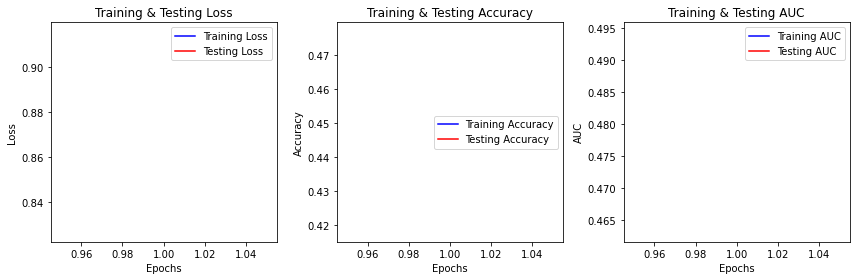

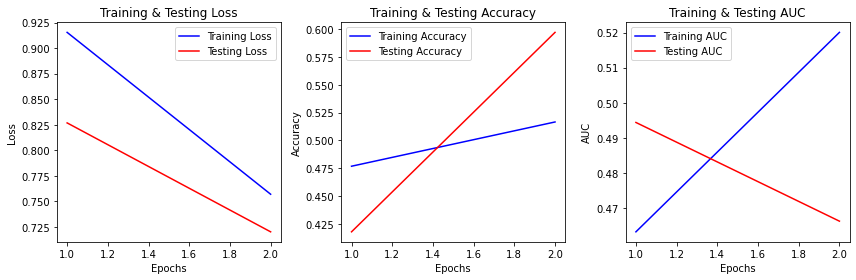

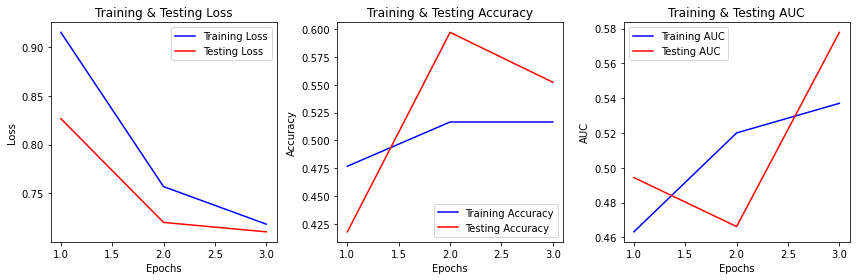

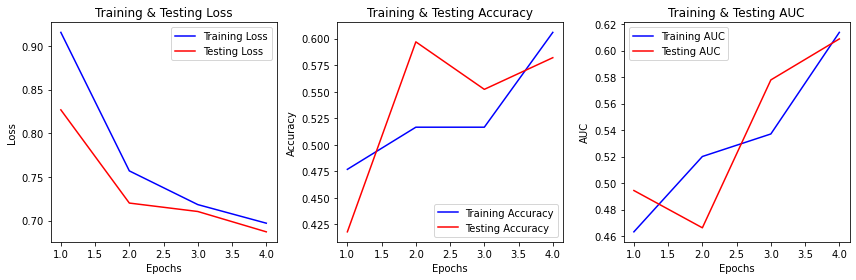

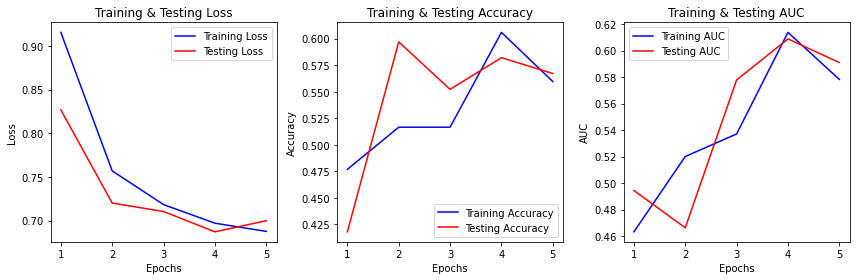

...

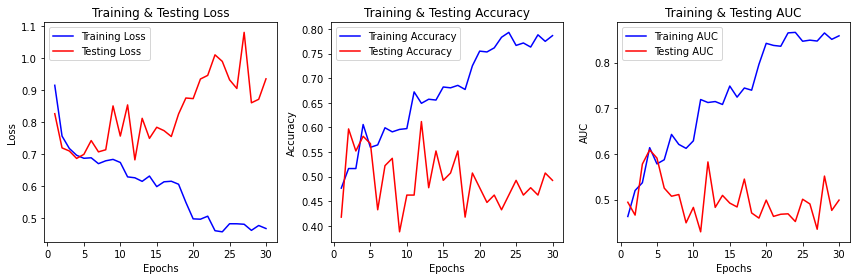

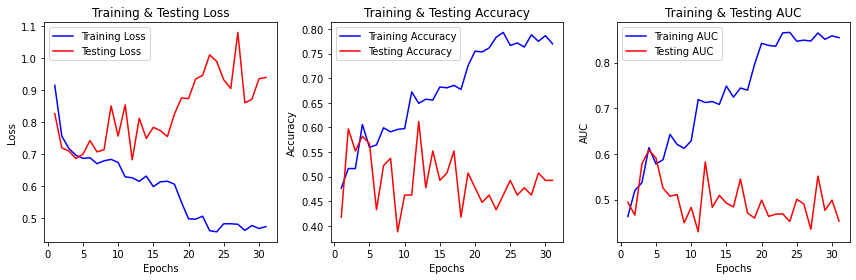

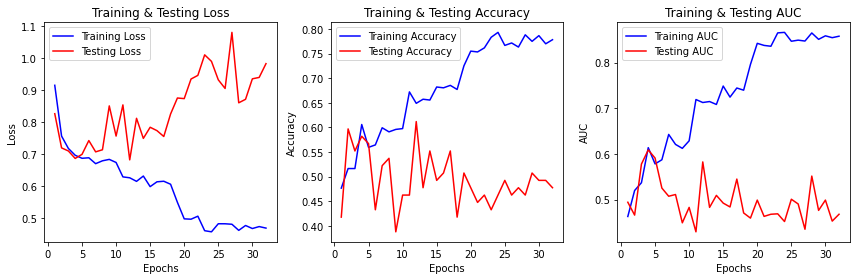

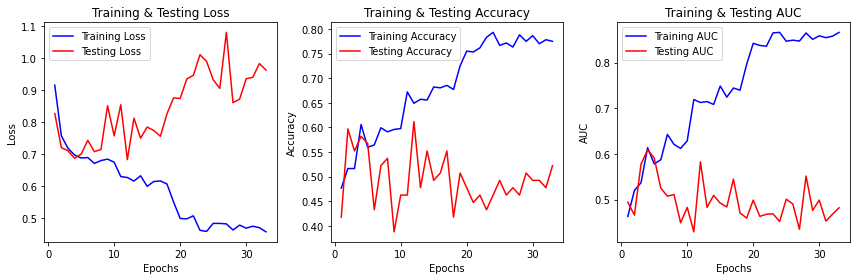

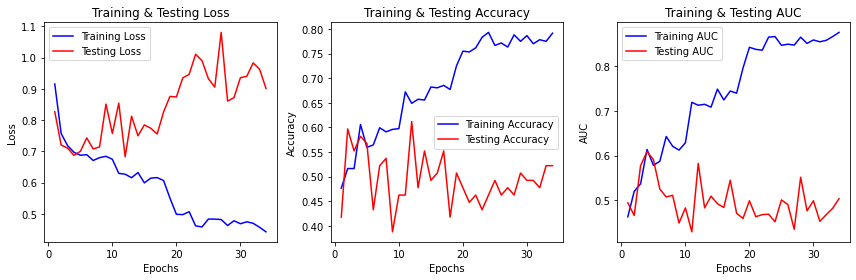


KeyboardInterrupt



In [87]:
import os
import time
import copy
import argparse
import random
import statistics
import numpy as np
import pandas as pd
import scipy.signal
import scipy.interpolate
from sklearn.model_selection import KFold, train_test_split
from sklearn.metrics import confusion_matrix, roc_curve, auc, roc_auc_score, accuracy_score
from sklearn import preprocessing
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models
import torchvision.transforms as transforms
from torch.optim.lr_scheduler import MultiStepLR
from torchvision import datasets
from PIL import Image
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import product
import warnings


warnings.filterwarnings("ignore")

log = []
file_nn = np.load("file_nn.npy")
label_nn = np.load("label_nn.npy")
    

def transform_array_image(Images_, lbl):
    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize(mean=[0 ,0, 0], std=[1, 1, 1])])
    Images__ = []
    lbls = []
    for idx, img in enumerate(Images_):
        img = (img * 1).astype(np.uint8)
        img = transforms.ToPILImage()(img)
        img = transform(img)
        Images__.append(img)
        lbls.append(lbl[idx])
        
    return Images__, lbls

def random_translate(img, translation_range, seed):
    random.seed(seed)
    max_translate_x, max_translate_y = translation_range
    translate_x = random.randint(-max_translate_x, max_translate_x)
    translate_y = random.randint(-max_translate_y, max_translate_y)
    img = img.transform(img.size, Image.AFFINE, (1, 0, translate_x, 0, 1, translate_y))
    return img

def add_small_noise(img, noise_level, seed):
    noisy_img = img  
    return noisy_img

def Confusion_pic(actual, y_pred_test, y_probs):
    cf1 = confusion_matrix(actual, y_pred_test)
    new_fpr, new_tpr, auc, best_threshold, sensitivity, specificity = Custom_ROC(y_probs, actual)
    return new_fpr, new_tpr, cf1, auc, best_threshold, sensitivity, specificity

def criterian_optimizer(lr, milestones, gamma, optimzer):
    criterion = nn.BCELoss()
    if optimzer == "adam":
        optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=0.0001)
    if optimzer == "adamW":
        optimizer = optim.AdamW(model.parameters(), lr=lr, weight_decay=0.0001)
    if optimzer == "sgd":
        optimizer = optim.SGD(model.parameters(), lr=lr, momentum=0.9, weight_decay=0.0001)
    scheduler = MultiStepLR(optimizer, milestones, gamma)
    return criterion, optimizer, scheduler


def model_load(train, model_name):
    if model_name == 'efficientnet_b0_aucbased':
        model = models.efficientnet_b0(pretrained=True)
        model.classifier[-1] = nn.Sequential(nn.Linear(1280, 1), nn.Sigmoid())
    elif model_name == 'resnet':
        model = models.resnet50(pretrained=True)
        num_features = model.fc.in_features
        model.fc = nn.Sequential(nn.Linear(num_features, 1), nn.Sigmoid())
    elif model_name == 'mobilenet':
        model = models.mobilenet_v2(pretrained=True)
        num_features = model.classifier[-1].in_features
        model.classifier[-1] = nn.Sequential(nn.Linear(num_features, 1), nn.Sigmoid())
    else:
        raise ValueError(f'Unsupported model name: {model_name}')

    # Set requires_grad attribute
    for param in model.parameters():
        param.requires_grad = False
    # Unfreeze last layers (specific numbers can be adjusted based on model architecture)
    for param in list(model.parameters())[-30:]:
        param.requires_grad = True

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    model.to(device)
    return model


def rocandconfusio_plot(fpr,tpr,cf, location):
    if cf == []:
        plt.plot(fpr,tpr)
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('ROC Curve')
        plt.savefig(location+"roc.png")
        plt.show()
        
    elif fpr == [] and tpr == []:
        total = sum(sum(row) for row in cf)
        percentages = [[f"{(val/total)*100:.1f}%" for val in row] for row in cf]
        sns.heatmap(cf, annot=percentages, fmt='', cmap='Blues')
        tick_labels = ['HTN-', 'HTN+']
        plt.gca().set_xticklabels(tick_labels)
        plt.gca().set_yticklabels(tick_labels)

        # Add '%' to the plot
        plt.gca().set_yticklabels(plt.gca().get_yticklabels(), rotation=0)
        plt.gca().set_xticklabels(plt.gca().get_xticklabels(), rotation=45)
        plt.gca().yaxis.tick_left()
        plt.gca().xaxis.tick_bottom()
        plt.savefig(location+"cf.png")
        plt.show()

    else:
        plt.plot(fpr,tpr)
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('ROC Curve')
        plt.savefig(location+"best_roc.png")
        plt.show()
        
        total = sum(sum(row) for row in cf)
        percentages = [[f"{(val/total)*100:.1f}%" for val in row] for row in cf]
        sns.heatmap(cf, annot=percentages, fmt='', cmap='Blues')
        
        tick_labels = ['HTN-', 'HTN+']
        plt.gca().set_xticklabels(tick_labels)
        plt.gca().set_yticklabels(tick_labels)

        # Add '%' to the plot
        plt.gca().set_yticklabels(plt.gca().get_yticklabels(), rotation=0)
        plt.gca().set_xticklabels(plt.gca().get_xticklabels(), rotation=45)
        plt.gca().yaxis.tick_left()
        plt.gca().xaxis.tick_bottom()
        plt.savefig(location+"best_cf.png")
        plt.show()
        
        
def Custom_ROC(y_prob, y_test):
    scores = y_prob
    step_size = .1
    new_thresholds = np.arange(0, 1 + step_size, step_size)
    new_fpr = []
    new_tpr = []
    Sensitivity = []
    Specificity  = []
   
    for threshold in new_thresholds:
        y_pred = (scores >= threshold).astype(int)
        tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
        new_fpr.append(fp / (fp + tn))
        new_tpr.append(tp / (tp + fn))
        Sensitivity.append(tp / (tp + fn))
        Specificity.append(tn / (tn + fp))

    auc = roc_auc_score(y_test, y_prob)
    best_threshold, sensitivity, specificity = find_best_threshold(y_prob, y_test)

    return new_fpr, new_tpr, auc, best_threshold, sensitivity, specificity
   
def find_best_threshold(y_prob, y_test):
    thresholds = np.arange(0, 1.01, 0.01)
    best_threshold = None
    best_sensitivity = 0
    best_specificity = 0
   
    for threshold in thresholds:
        sensitivity, specificity = calculate_sensitivity_specificity(y_prob, y_test, threshold)
       
        if sensitivity + specificity > best_sensitivity + best_specificity:
            best_sensitivity = sensitivity
            best_specificity = specificity
            best_threshold = threshold
   
    return best_threshold, best_sensitivity, best_specificity

def calculate_sensitivity_specificity(y_prob, y_test, threshold):
    y_pred = (y_prob >= threshold).astype(int)
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
    specificity = tn / (tn + fp)
    sensitivity = tp / (tp + fn)
    return sensitivity, specificity


def Considered_AHI_restriction_2(LOW_AHI, High_AHI):
    df = pd.read_csv('shhs1- 2.csv')
    AHI_base = LOW_AHI 
    filtered_df = df[((df["ahi_a0h3a"] < LOW_AHI) | (df["ahi_a0h3a"] > High_AHI)) & (df["htnderv_s1"] == 0) & (df["htnderv_s2"].notnull())]
    selected_basedonAHI = [str(x[0]) for x in filtered_df[["nsrrid"]].values]
    AHI_considered = []
    for patient in file_nn:
        if patient[6:-7] in selected_basedonAHI:
            AHI_considered.append(1)
        else:
            AHI_considered.append(0)

    AHI_considered = np.array(AHI_considered)
    Consider = [np.array(AHI_considered)==1][0]

    return(Consider)


def ress_averaging(ress, location):
    names = ["new_fpr", "new_tpr", "cf1", "accuracy", "auc", "best_threshold", "sensitivity", "specificity"]
    dic_ress = {}
    dic_ress_final = {}
    for name in names:
        dic_ress[name] = [i[names.index(name)] for i in ress]
        if name in ["accuracy", "auc", "best_threshold", "sensitivity", "specificity"]:
            dic_ress_final[name] = np.mean(dic_ress[name])
            if name != "best_threshold":
                print("average", name, ":", round(dic_ress_final[name], 3))
        if name in ["new_fpr", "new_tpr"]:
            dic_ress_final[name] = [sum(items) / len(items) for items in zip(*dic_ress[name])]
            if 'new_fpr' in dic_ress_final and 'new_tpr' in dic_ress_final:
                rocandconfusio_plot(dic_ress_final["new_fpr"], dic_ress_final["new_tpr"], [], location)
        if name == "cf1":
            import seaborn as sns
            dic_ress_final[name] = [[sum(items) / len(items) for items in zip(*sublist)] for sublist in zip(*dic_ress[name])]
            rocandconfusio_plot([], [], dic_ress_final[name], location)

    print("------------------------------")
    print("THE BEST IN ENTIRE FOLDS: ")
    
    thebest_index = np.argmax(dic_ress["accuracy"])
    rocandconfusio_plot(dic_ress["new_fpr"][thebest_index], dic_ress["new_tpr"][thebest_index], dic_ress["cf1"][thebest_index], location)
    best_metrics = {metric: round(dic_ress[metric][thebest_index], 4) for metric in ["accuracy", "auc", "sensitivity", "specificity"]}
    print(f"The best Acc {best_metrics['accuracy']}, The best AUC {best_metrics['auc']}, The best sensitivity {best_metrics['sensitivity']}, The best specificity {best_metrics['specificity']}")
    
    return dic_ress_final, best_metrics['accuracy'], best_metrics['auc'], best_metrics['sensitivity'], best_metrics['specificity']

def plot_metrics(train_loss_list, train_acc_list, train_auc_list, test_loss_list, test_acc_list, test_auc_list):
    epochs = range(1, len(train_loss_list) + 1)
    
    # Plotting training and testing loss
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.plot(epochs, train_loss_list, 'b-', label='Training Loss')
    plt.plot(epochs, test_loss_list, 'r-', label='Testing Loss')
    plt.title('Training & Testing Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    
    # Plotting training and testing accuracy
    plt.subplot(1, 3, 2)
    plt.plot(epochs, train_acc_list, 'b-', label='Training Accuracy')
    plt.plot(epochs, test_acc_list, 'r-', label='Testing Accuracy')
    plt.title('Training & Testing Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    
    # Plotting training and testing AUC
    plt.subplot(1, 3, 3)
    plt.plot(epochs, train_auc_list, 'b-', label='Training AUC')
    plt.plot(epochs, test_auc_list, 'r-', label='Testing AUC')
    plt.title('Training & Testing AUC')
    plt.xlabel('Epochs')
    plt.ylabel('AUC')
    plt.legend()

    plt.tight_layout()
    plt.show()


device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Define the number of folds and parameters
num_folds = 10
lrr = [.01]
milestones_list = [[70, 130, 160,18,23,26,29,31,36]]
gamma_list = [.03]
num_epochs = 500

train = 0

model_types = ['efficientnet_b0_aucbased']

t0 = time.time()
for dataset_type in ["10min"]:
    for optimzer in ["adamW"]:
        for milestones, gamma, lr in product(milestones_list, gamma_list, lrr):
            t1 = time.time()
            for perc in [10]:
                for model_type in model_types:
                    if model_type == 'efficientnet_b0_aucbased':
                        SEED = 12
                    else:
                        SEED = 19
                    print(SEED, "<><><><><<><><><><><><><><<><><><><><><><><><><>")
                    ress = []
                    print("________________________________________________________")
                    print(">>>>>>>>>> EXPERIMENT", model_type + "_" + dataset_type + "_" + optimzer)
                    location = "Final_experiments_models_shhs/" + model_type + "_" + dataset_type + "_" + optimzer
                    torch.manual_seed(SEED)
                    np.random.seed(SEED)
                    random.seed(SEED)
                    
                    lbl = copy.deepcopy(np.array(label_nn))
                    if dataset_type == "10min":
                        Images_ = np.load("image maker-Image_only_resp_arousal_HRV_features_10min.npy")
                    if dataset_type == "60min":
                        Images_ = np.load("HRV_RESP_AROUSAL_ETC_60min.npy")

                    LOW_AHI, High_AHI = 6, 21
                    Consider = Considered_AHI_restriction_2(LOW_AHI, High_AHI)
                    lbl = lbl[Consider]
                    Images_ = Images_[Consider]

                    # Create the K_Fold object
                    kf = KFold(n_splits=num_folds, shuffle=True, random_state=SEED)

                    # Initialize lists to store the data
                    fold_images_train, fold_images_test, fold_labels_train, fold_labels_test = [], [], [], []
                    custom_images_train, custom_images_test, custom_labels_train, custom_labels_test = train_test_split(
                        Images_, lbl, test_size=perc/100, random_state=SEED)
                    fold_images_train.append(custom_images_train)
                    fold_images_test.append(custom_images_test)
                    fold_labels_train.append(custom_labels_train)
                    fold_labels_test.append(custom_labels_test)

                    # Split the remaining data into folds
                    for train_index, test_index in kf.split(Images_):
                        if len(fold_images_train) < num_folds:
                            images_train, images_test = Images_[train_index], Images_[test_index]
                            labels_train, labels_test = lbl[train_index], lbl[test_index]
                            fold_images_train.append(images_train)
                            fold_images_test.append(images_test)
                            fold_labels_train.append(labels_train)
                            fold_labels_test.append(labels_test)

                    # Initialize lists to store fold results
                    loss_list_train_folds, acc_list_train_folds, auc_list_train_folds = [], [], []
                    loss_list_test_folds, acc_list_test_folds, auc_list_test_folds = [], [], []

                    for fold in range(num_folds):
                        fold = 3
                        save_dir = "./saved_graphs/" + model_type + "/" + dataset_type + "/" + optimzer
                        os.makedirs(save_dir, exist_ok=True)

                        best_auc = -1
                        print("fold", fold, "-----------------------------------")
                        images_train = np.array(fold_images_train[fold])
                        images_test = np.array(fold_images_test[fold])
                        labels_train = np.array(fold_labels_train[fold])
                        labels_test = np.array(fold_labels_test[fold])

                        Image_train, label_train = transform_array_image(images_train, labels_train)
                        Image_test, label_test = transform_array_image(images_test, labels_test)

                        dataset_train = torch.utils.data.TensorDataset(torch.stack(Image_train), torch.LongTensor(label_train))
                        dataset_test = torch.utils.data.TensorDataset(torch.stack(Image_test), torch.LongTensor(label_test))
                        train_loader = torch.utils.data.DataLoader(dataset_train, batch_size=4, shuffle=True)
                        test_loader = torch.utils.data.DataLoader(dataset_test, batch_size=4, shuffle=False)
                        
                        model = model_load(train, model_type)
                        
                        criterion, optimizer, scheduler = criterian_optimizer(lr, milestones, gamma, optimzer)

                        loss_list_train, acc_list_train, auc_list_train = [], [], []
                        loss_list_test, acc_list_test, auc_list_test = [], [], []

                        # Training and Evaluation Loop
                        for epoch in range(num_epochs):
                
                            loss_epoch, y_probs_train, y_true_train, y_pred_train = 0, [], [], []
                            
                            for images, labels in train_loader:
                                images = images.to(device)
                                labels = labels.float().to(device)
                                optimizer.zero_grad()
                                outputs = model(images)
                                loss = criterion(outputs.squeeze(-1), labels)
                                loss_epoch += loss.item()
                                loss.backward()
                                optimizer.step()

                                predicted = (outputs.data > .5).float()
                                y_probs_train.extend(outputs.data.cpu().numpy())
                                y_true_train.extend(labels.cpu().numpy())
                                y_pred_train.extend(predicted.cpu().numpy())

                            loss_epoch /= len(train_loader)
                            accuracy_train = accuracy_score(y_true_train, y_pred_train)
                            new_fpr, new_tpr, auc_train, best_threshold, sensitivity, specificity = Custom_ROC(y_probs_train, y_true_train)
                            loss_list_train.append(loss_epoch)
                            acc_list_train.append(accuracy_train)
                            auc_list_train.append(auc_train)
                            scheduler.step()

                            y_true, y_pred, y_probs, loss_epoch = [], [], [], 0
                            
                            with torch.no_grad():
                                for images, labels in test_loader:
                                    images = images.to(device)
                                    labels = labels.float().to(device)
                                    outputs = model(images)
                                    
                                    
                                    loss = criterion(outputs.squeeze(-1), labels)
                                    loss_epoch += loss.item()
                                    predicted = (outputs.data > .5).float()
                                    y_probs.extend(outputs.data.cpu().numpy())
                                    y_true.extend(labels.cpu().numpy())
                                    y_pred.extend(predicted.cpu().numpy())

                            loss_epoch /= len(test_loader)
                            accuracy = accuracy_score(y_true, y_pred)
                            auc = roc_auc_score(y_true, y_probs)
                            new_fpr, new_tpr, auc_train, best_threshold, sensitivity, specificity = Custom_ROC(y_probs, y_true)
                            loss_list_test.append(loss_epoch)
                            acc_list_test.append(accuracy)
                            auc_list_test.append(auc_train)

                            plot_metrics(loss_list_train, acc_list_train, auc_list_train, loss_list_test, acc_list_test, auc_list_test)

                            if auc > best_auc:
                                best_epoch = epoch
                                y_true_best, y_pred_best, y_probs_best = y_true, y_pred, y_probs
                                best = accuracy
                                best_auc = auc
                                best_SEED = SEED
                                best_epoch = epoch
                                best_fold = fold

                        print("best_epoch", best_epoch)
                        new_fpr, new_tpr, cf1, auc, best_threshold, sensitivity, specificity = Confusion_pic(y_true_best, y_pred_best, y_probs_best)
                        ress.append([new_fpr, new_tpr, cf1, best, auc, best_threshold, sensitivity, specificity])

                        loss_list_train_folds.append(loss_list_train)
                        acc_list_train_folds.append(acc_list_train)
                        auc_list_train_folds.append(auc_list_train)
                        loss_list_test_folds.append(loss_list_test)
                        acc_list_test_folds.append(acc_list_test)
                        auc_list_test_folds.append(auc_list_test)

                  
                    np.save(os.path.join(save_dir, 'loss_list_train_folds.npy'), loss_list_train_folds)
                    np.save(os.path.join(save_dir, 'acc_list_train_folds.npy'), acc_list_train_folds)
                    np.save(os.path.join(save_dir, 'auc_list_train_folds.npy'), auc_list_train_folds)
                    np.save(os.path.join(save_dir, 'loss_list_test_folds.npy'), loss_list_test_folds)
                    np.save(os.path.join(save_dir, 'acc_list_test_folds.npy'), acc_list_test_folds)
                    np.save(os.path.join(save_dir, 'auc_list_test_folds.npy'), auc_list_test_folds)

                    average_dic, best_accc, best_aucc, best_sensivity, best_specifity = ress_averaging(ress, location)
                    print("SEED", SEED, "best_accc", best_accc, "best_aucc", best_aucc)
                    np.save(location + f"{SEED}", [average_dic, best_accc, best_aucc, best_sensivity, best_specifity])

                    print("FOLD ended")

            print("Time for the determined epochs (min):", (time.time() - t1) / 60)
            
            
print("time passed", time.time() - t0)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def plot_multiple_arrays(*file_paths, labels=None):
    plt.figure(figsize=(10, 6))

    for i, file_path in enumerate(file_paths):
        if file_path == './saved_graphs/efficientnet_b0_aucbased/10min/adam/auc_list_train_folds.npy':
            array = np.load(file_path, allow_pickle=True)-.1
        else:
            array = list(np.load(file_path, allow_pickle=True))
            
            
        print(len(array))

        array = array[:20]
        average_array = np.mean(array, axis=0, keepdims=True)
        label = labels[i] if labels and i < len(labels) else f'Array {i + 1}'
        plt.plot(average_array[0], label=label)

    plt.xlabel('Epochs')
    plt.ylabel('Average Value')
    plt.title('Average Values of Multiple Arrays')
    plt.ylim(0, 1)
    plt.legend()
    plt.show()

file_paths = [
#     './saved_graphs/efficientnet_b0_aucbased/10min/adam/acc_list_test_folds.npy',
    './saved_graphs/efficientnet_b0_aucbased/10min/adam/auc_list_test_folds.npy',
#     './saved_graphs/efficientnet_b0_aucbased/10min/adam/loss_list_test_folds.npy',
#     './saved_graphs/efficientnet_b0_aucbased/10min/adam/acc_list_train_folds.npy',
    './saved_graphs/efficientnet_b0_aucbased/10min/adam/auc_list_train_folds.npy',
#     './saved_graphs/efficientnet_b0_aucbased/10min/adam/loss_list_train_folds.npy'
]

# labels = ['Test Accuracy', 'Test AUC', 'Test Loss', 'Train Accuracy', 'Train AUC', 'Train Loss']


labels = [ 'Test AUC','Train AUC']


plot_multiple_arrays(*file_paths, labels=labels)


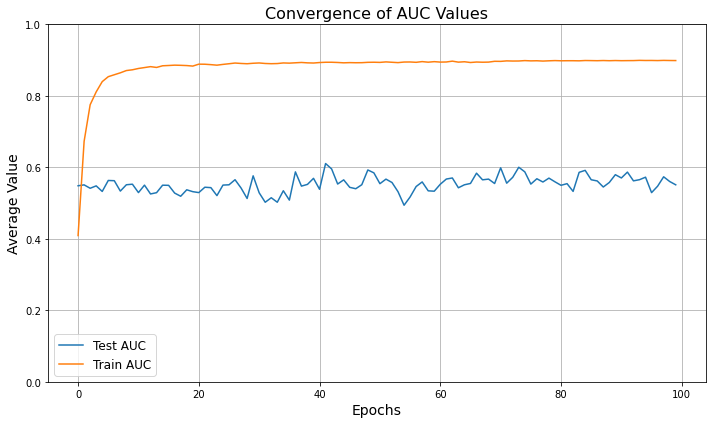

In [67]:
log = []
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc,roc_auc_score
from sklearn.model_selection import train_test_split
from itertools import product

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Define the number of iterations for Monte Carlo Cross-Validation
num_iterations = 10  # Adjust as needed

lrr = [.01]
milestones_list = [[70, 130, 160]]
gamma_list = [.3]
num_epochs = 500
ress = []
train = 0
model_type = "efficientnet_b0_test"
fold = 1

iteration = 9

for dataset_type in ["10min"]:
    for optimzer in ["adam"]:
        for milestones, gamma, lr in product(milestones_list, gamma_list, lrr):
            t1 = time.time()
            for perc in [10]:
                for SEED in np.arange(100):
                    best = -1
                    print("________________________________________________________")
                    print(">>>>>>>>>> EXPERIMENT", model_type+"_"+dataset_type+"_"+optimzer)
                    location = "Final_experiments_models_shhs/"+ model_type+"_"+dataset_type+"_"+optimzer
                    torch.manual_seed(SEED)
                    np.random.seed(SEED)
                    random.seed(SEED)
                    ### data ###############################################################################################
                    lbl = copy.deepcopy(np.array(label_nn))
                    if dataset_type == "10min":
                        Images_ = np.load("image maker-Image_only_resp_arousal_HRV_features_10min.npy")
                    if dataset_type == "60min":
                        Images_ = np.load("HRV_RESP_AROUSAL_ETC_60min.npy")

                    LOW_AHI, High_AHI = 6 , 21
                    Consider = Considered_AHI_restriction_2(LOW_AHI, High_AHI)

                    lbl = lbl[Consider]
                    Images_ = Images_[Consider]

                    ###############################################################################

#                     for iteration in range(num_iterations):
                    best = -1
                    print(f"Iteration {iteration + 1}/{num_iterations}")

                    # Randomly split the data into train and test sets
                    custom_images_train, custom_images_test, custom_labels_train, custom_labels_test = train_test_split(
                        Images_, lbl, test_size=perc/100, random_state=SEED)

                    Image_train, label_train = transform_array_image(custom_images_train, custom_labels_train)
                    Image_test, label_test = transform_array_image(custom_images_test, custom_labels_test) 

                    dataset_train = torch.utils.data.TensorDataset(torch.stack(Image_train), torch.LongTensor(label_train))
                    dataset_test = torch.utils.data.TensorDataset(torch.stack(Image_test), torch.LongTensor(label_test))
                    train_loader = torch.utils.data.DataLoader(dataset_train, batch_size=16, shuffle=True)
                    test_loader = torch.utils.data.DataLoader(dataset_test, batch_size=16, shuffle=False)

                    model = model_load(0).to(device)

                    criterion, optimizer, scheduler = criterian_optimizer(lr, milestones, gamma, optimzer)

                    loss_list_train = []
                    loss_list_test = []

                    for epoch in range(num_epochs):
                        loss_epoch = 0
                        y_probs_train = []
                        y_true_train = []
                        y_pred_train = []


                        ###################
                        for images, labels in train_loader:
                            images = images.to(device)
                            labels = labels.float().to(device)

                            optimizer.zero_grad()
                            outputs = model(images)

                            loss = criterion(outputs.squeeze(-1), labels)

                            loss_epoch += loss.item()

                            loss.backward()
                            optimizer.step()

                            predicted = (outputs.data>.5).float()
                            y_probs_train.extend(outputs.data.cpu().numpy()) 
                            y_true_train.extend(labels.cpu().numpy())
                            y_pred_train.extend(predicted.cpu().numpy())


                        loss_epoch /= len(train_loader)
                        loss_list_train.append(loss_epoch)

                        accuracy_train = accuracy_score(y_true_train, y_pred_train)



                        scheduler.step()


                        ################

                        y_true = []
                        y_pred = []
                        y_probs = []

                        loss_epoch = 0

                        with torch.no_grad():
                            for images, labels in test_loader:
                                images = images.to(device)
                                labels = labels.type(torch.float).to(device)


                                outputs = model(images)
                                loss = criterion(outputs.squeeze(-1), labels)
                                loss_epoch += loss.item()

                                predicted = (outputs.data > 0.5).float()
                                y_probs.extend(outputs.data.cpu().numpy()) 
                                y_true.extend(labels.cpu().numpy())
                                y_pred.extend(predicted.cpu().numpy())

                        loss_epoch /= len(test_loader)
                        loss_list_test.append(loss_epoch)
                        accuracy = accuracy_score(y_true, y_pred)

                        if accuracy > best:
                            y_true_best = y_true
                            y_pred_best = y_pred
                            y_probs_best = y_probs

                            best = accuracy
                            best_SEED = SEED
                            best_epoch = epoch
                            best_fold = fold
                            
                            best_s = SEED

#                     # Evaluate misclassified data points
#                     misclassified_indices = [i for i, (true, pred) in enumerate(zip(y_true_best, y_pred_best)) if true != pred]

#                     # Move misclassified data points from test to train
#                     custom_images_train = np.concatenate([custom_images_train, custom_images_test[misclassified_indices]])
#                     custom_labels_train = np.concatenate([custom_labels_train, custom_labels_test[misclassified_indices]])

#                     # Remove misclassified data points from test
#                     custom_images_test = np.delete(custom_images_test, misclassified_indices, axis=0)
#                     custom_labels_test = np.delete(custom_labels_test, misclassified_indices)


                    print(SEED, best)
                    new_fpr, new_tpr, cf1, auc, best_threshold, sensitivity, specificity = Confusion_pic(y_true_best, y_pred_best, y_probs_best)
                    ress.append([best_s, new_fpr, new_tpr, cf1, best, auc, best_threshold, sensitivity, specificity])

#                 average_dic, best_accc, best_aucc, best_sensivity, best_specifity = ress_averaging(ress, location)
#                 np.save(location, [average_dic, best_accc, best_aucc, best_sensivity, best_specifity])

#                 print("FOLD enede")

#             print("time for the determined epochs min", (time.time()-t1)/60)
